In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.animation import FuncAnimation

%matplotlib inline
from IPython.display import HTML

In [2]:
# --- Synthetic Data ---
np.random.seed(42)
X1 = np.random.rand(150, 1)
X2 = np.random.rand(150, 1)
y = 1.2*X1 + 2.7*X2 + 4.3 + np.random.randn(150, 1)*0.1
X_b = np.c_[np.ones((150, 1)), X1, X2]  # bias + features

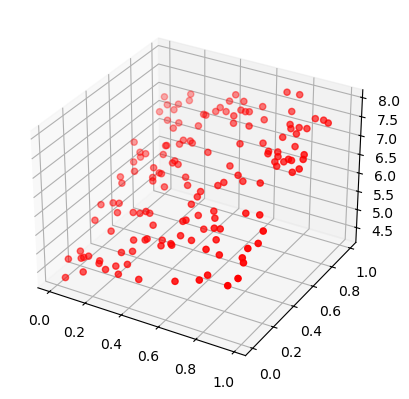

In [3]:
fig = plt.figure()
ax1 = fig.add_subplot(111, projection='3d')
ax1.scatter(X1, X2, y, c='r', marker='o')
plt.show()

In [4]:
 def cost_function(theta, X, y):
    m = len(y)
    return (1/(2*m)) * np.sum((X.dot(theta) - y)**2)

def compute_gradient(theta, X, y):
    m = len(y)
    return (1/m) * X.T.dot(X.dot(theta) - y)

def gradient_descent(X, y, lr=0.5, iterations=100):
    theta = np.random.randn(X.shape[1], 1)
    history = [theta.copy()]
    costs = [cost_function(theta, X, y)]
    for _ in range(iterations):
        theta -= lr * compute_gradient(theta, X, y)
        history.append(theta.copy())
        costs.append(cost_function(theta, X, y))
    return history, costs

history, costs = gradient_descent(X_b, y)


In [7]:
fig = plt.figure(figsize=(12,5))

# Subplot 1: 3D regression plane
ax1 = fig.add_subplot(121, projection='3d')
X1_grid, X2_grid = np.meshgrid(np.linspace(0,1,20), np.linspace(0,1,20))

# Subplot 2: Cost curve
ax2 = fig.add_subplot(122)
ax2.set_title("Cost vs Iteration")
ax2.set_xlabel("Iteration")
ax2.set_ylabel("Cost")
line, = ax2.plot([], [], 'b-')
ax2.set_xlim(0, len(costs))
ax2.set_ylim(0, max(costs))

def update(i):
    # --- Left subplot: regression plane ---
    ax1.clear()
    ax1.scatter(X1, X2, y, c='r', marker='o')
    theta = history[i]
    y_pred = theta[0] + theta[1]*X1_grid + theta[2]*X2_grid
    ax1.plot_surface(X1_grid, X2_grid, y_pred, alpha=0.5, color='blue')
    ax1.set_title(f"Iteration {i}")

    # --- Right subplot: cost curve ---
    line.set_data(range(i+1), costs[:i+1])
    return line,

ani = FuncAnimation(fig, update, frames=len(history), interval=100, blit=False)
HTML(ani.to_jshtml())